## Cloning WAVES benchmark

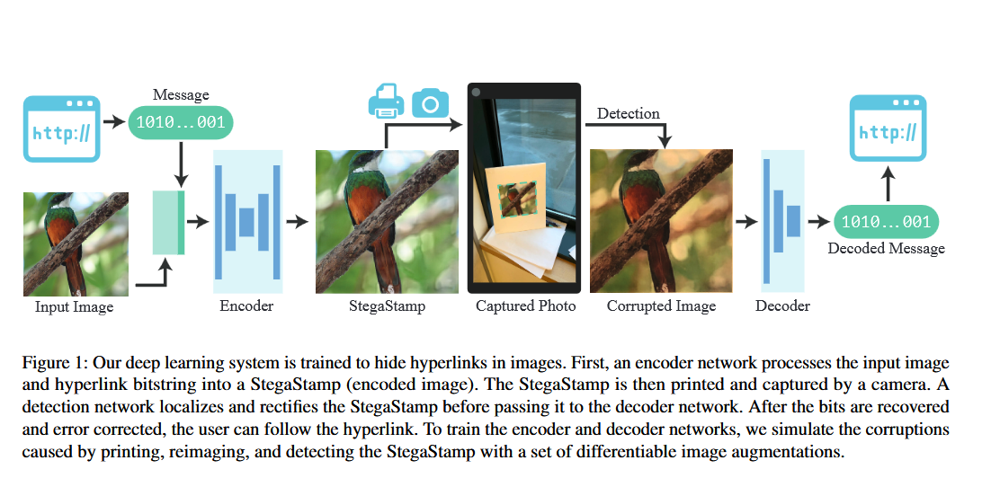

In [ ]:
!git clone https://github.com/umd-huang-lab/WAVES.git
%cd WAVES/

Cloning into 'WAVES'...
remote: Enumerating objects: 278, done.
remote: Counting objects: 100% (13/13), done.
remote: Compressing objects: 100% (11/11), done.
remote: Total 278 (delta 2), reused 2 (delta 2), pack-reused 265 (from 1)
Receiving objects: 100% (278/278), 27.49 MiB | 20.43 MiB/s, done.
Resolving deltas: 100% (8/8), done.
Filtering content: 100% (41/41), 810.19 MiB | 38.63 MiB/s, done.
/content/WAVES


In [ ]:
!bash shell_scripts/install_dependencies.sh

The virtual environment was not created successfully because ensurepip is not
available.  On Debian/Ubuntu systems, you need to install the python3-venv
package using the following command.

    apt install python3.10-venv

You may need to use sudo with that command.  After installing the python3-venv
package, recreate your virtual environment.

Failing command: /content/WAVES/venv/bin/python3

shell_scripts/install_dependencies.sh: line 5: venv/bin/activate: No such file or directory
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 23.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 820.8/820.8 kB 39.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.8/139.8 kB 9.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 32.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.4/85.4 kB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 46.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

## Imports & Functions

In [ ]:
import os
from typing import List

import click
import torch
import numpy as np
import onnxruntime as ort
import torch.multiprocessing as mp
from PIL import Image, ImageOps
import warnings
from tqdm.auto import tqdm
from torchvision import transforms
import dotenv
import matplotlib.pyplot as plt
from dev import (
    LIMIT,
    SUBSET_LIMIT,
    WATERMARK_METHODS,
    check_file_existence,
    existence_operation,
    existence_to_indices,
    parse_image_dir_path,
    save_json,
    load_json,
    encode_array_to_string,
)

dotenv.load_dotenv(override=False)
warnings.filterwarnings("ignore")


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# code from https://github.com/umd-huang-lab/WAVES/blob/main/scripts/decode.py
def init_model(mode: str = "stable_sig",
               gpu: int = 1):
    if mode == "tree_ring":
        size = 64
        radius = 10
        channel = 3
        mask = torch.zeros((1, 4, size, size), dtype=torch.bool)
        x0 = y0 = size // 2
        y, x = np.ogrid[:size, :size]
        y = y[::-1]
        mask[:, channel] = torch.tensor(((x - x0) ** 2 + (y - y0) ** 2) <= radius**2)
        return mask
    elif mode == "stable_sig":
        session_options = ort.SessionOptions()
        session_options.intra_op_num_threads = 1
        session_options.inter_op_num_threads = 1
        session_options.log_severity_level = 3
        return ort.InferenceSession(
            os.path.join("decoders", "stable_signature.onnx"),
            providers=["CUDAExecutionProvider"],
            provider_options=[{"device_id": str(gpu)}],
            sess_options=session_options,
        )
    elif mode == "stegastamp":
        session_options = ort.SessionOptions()
        session_options.intra_op_num_threads = 1
        session_options.inter_op_num_threads = 1
        session_options.log_severity_level = 3
        return ort.InferenceSession(
            os.path.join("decoders", "stega_stamp.onnx"),
            providers=["CUDAExecutionProvider"],
            provider_options=[{"device_id": str(gpu)}],
            sess_options=session_options,
        )


def load_files(mode: str = "stable_sig",
               path: str = "Neurips24_ETI_BeigeBox",
               files_len: int = 1):
    if mode == "tree_ring":
        return torch.cat(
            [
                torch.load(
                    os.path.join(path, f"{idx}_reversed.pkl"), map_location="cpu"
                )
                for idx in range(files_len)
            ],
            dim=0,
        )
    elif mode == "stable_sig":
        return np.stack(
            [
                (
                    (
                        np.array(
                            Image.open(os.path.join(path, f"im{idx + 1}.jpg")).convert("RGB"),
                            dtype=np.float32,
                        )
                        / 255.0
                        - [0.485, 0.456, 0.406]
                    )
                    / [0.229, 0.224, 0.225]
                )
                .transpose((2, 0, 1))
                .astype(np.float32)
                for idx in range(files_len)
            ],
            axis=0,
        )
    elif mode == "stegastamp":
        return np.stack(
            [
                np.array(
                    ImageOps.fit(
                        Image.open(os.path.join(path, f"im{idx + 1}.jpg")).convert("RGB"), (400, 400)
                    ),
                    dtype=np.float32,
                )
                / 255.0
                for idx in range(files_len)
            ],
            axis=0,
        )


def decode(inputs: List[int],
           mode: str = "stable_sig",
           gpu: int = 1):
    model = init_model(mode, gpu)
    if mode == "tree_ring":
        fft_latents = torch.fft.fftshift(
            torch.fft.fft2(inputs.to(f"cuda:{gpu}")), dim=(-1, -2)
        )
        messages = torch.stack(
            [
                fft_latents[i].unsqueeze(0)[model].flatten()
                for i in range(fft_latents.shape[0])
            ],
            dim=0,
        )
        return torch.concatenate([messages.real, messages.imag], dim=1).cpu().numpy()
    elif mode == "stable_sig":
        outputs = model.run(
            None,
            {
                "image": inputs,
            },
        )
        return (outputs[0] > 0).astype(bool)
    elif mode == "stegastamp":
        outputs = model.run(
            None,
            {
                "image": inputs,
                "secret": np.zeros((inputs.shape[0], 100), dtype=np.float32),
            },
        )
        return outputs[2].astype(bool)


def encode(np_imgs, secrets):
    model = init_model(mode="stegastamp", gpu=1)

    wm_img, _ = model.run(
        output_names=['stegastamp', 'residual'],
        input_feed={'image': np_imgs, 'secret': secrets.astype(np.float32)}
    )

    return np_imgs, torch.tensor(wm_img).permute(0, 3, 1, 2)


def plot_results(output1, output2):
    fig, axs = plt.subplots(1, 2, figsize=(7, 3))
    axs[0].imshow(output1[0])
    axs[0].set_title('Original image')
    axs[0].axis('off')
    axs[1].imshow(output2[0].permute(1, 2, 0))
    axs[1].set_title('Original image + inverted watermark')
    axs[1].axis('off')
    plt.tight_layout()
    plt.show()

## watermarking

In [ ]:
!pwd

/content/WAVES


In [ ]:
!unzip /content/drive/MyDrive/mirflickr25k.zip -d /content/sample_data/

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: /content/sample_data/mirflickr/meta/tags_raw/tags5499.txt  
 extracting: /content/sample_data/mirflickr/meta/tags_raw/tags55.txt  
  inflating: /content/sample_data/mirflickr/meta/tags_raw/tags550.txt  
  inflating: /content/sample_data/mirflickr/meta/tags_raw/tags5500.txt  
  inflating: /content/sample_data/mirflickr/meta/tags_raw/tags5501.txt  
 extracting: /content/sample_data/mirflickr/meta/tags_raw/tags5502.txt  
 extracting: /content/sample_data/mirflickr/meta/tags_raw/tags5503.txt  
 extracting: /content/sample_data/mirflickr/meta/tags_raw/tags5504.txt  
  inflating: /content/sample_data/mirflickr/meta/tags_raw/tags5505.txt  
 extracting: /content/sample_data/mirflickr/meta/tags_raw/tags5506.txt  
 extracting: /content/sample_data/mirflickr/meta/tags_raw/tags5507.txt  
 extracting: /content/sample_data/mirflickr/meta/tags_raw/tags5508.txt  
  inflating: /content/sample_data/mirflickr/meta/tags_raw/t

In [ ]:
inputs = load_files(mode="stegastamp", path="/content/sample_data/mirflickr", files_len=6)

In [ ]:
from PIL import Image
import numpy as np

image = Image.open("/content/sample_data/mirflickr/im30.jpg")

image_np = np.array(image)

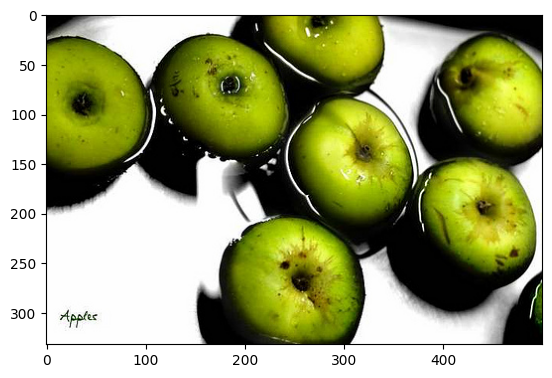

In [ ]:
plt.imshow(image_np)

In [ ]:
secret_list = [1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0,
        1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0,
        1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1,
        0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0]

In [ ]:
secrets = np.array(secret_list).reshape(1, -1).astype(np.float32)

In [ ]:
secrets

array([[1., 0., 0., 1., 0., 0., 1., 0., 1., 0., 0., 1., 1., 0., 0., 1.,
        1., 0., 0., 0., 0., 0., 1., 0., 1., 1., 0., 1., 1., 0., 0., 1.,
        0., 0., 1., 0., 1., 1., 1., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
        0., 1., 1., 0., 0., 0., 0., 0., 1., 0., 0., 1., 0., 1., 0., 0.,
        0., 0., 1., 0., 1., 1., 0., 1., 1., 0., 0., 0., 1., 1., 0., 0.,
        0., 0., 1., 1., 1., 0., 1., 1., 0., 0., 1., 0., 1., 1., 0., 0.,
        0., 0., 1., 0.]], dtype=float32)

In [ ]:
a, b = encode(inputs, np.array([secret_list for _ in range(inputs.shape[0])]))

In [ ]:
a.shape, b.shape

((6, 400, 400, 3), torch.Size([6, 3, 400, 400]))

In [ ]:
def plot_side_by_side(a, b, i):
    """Plots a[i] and b[i] side-by-side using matplotlib.pyplot."""

    fig, axs = plt.subplots(1, 3, figsize=(10, 5))

    axs[0].imshow(a[i])
    axs[0].set_title(f'original image [{i}]')
    axs[0].axis('off')

    b_temp = b[i].permute(1, 2, 0).numpy()

    axs[1].imshow(b[i].permute(1, 2, 0))
    axs[1].set_title(f'watermarked image [{i}]')
    axs[1].axis('off')

    diff = np.abs(a[i] - b_temp)
    axs[2].imshow(diff)
    axs[2].set_title(f'difference image [{i}]')
    axs[2].axis('off')

    plt.tight_layout()
    plt.show()

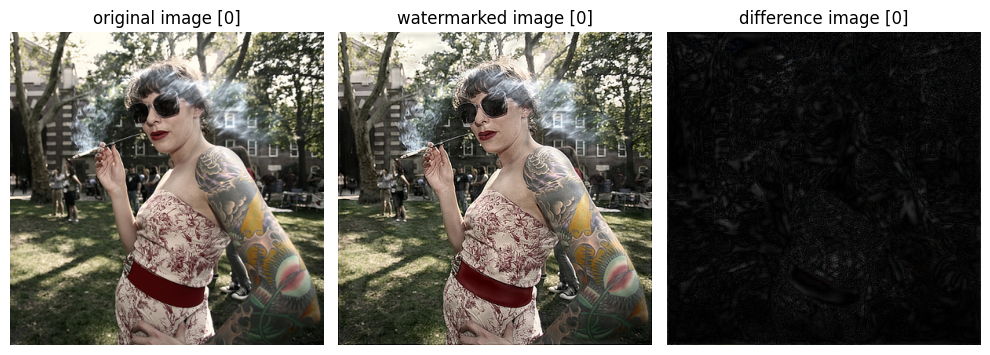

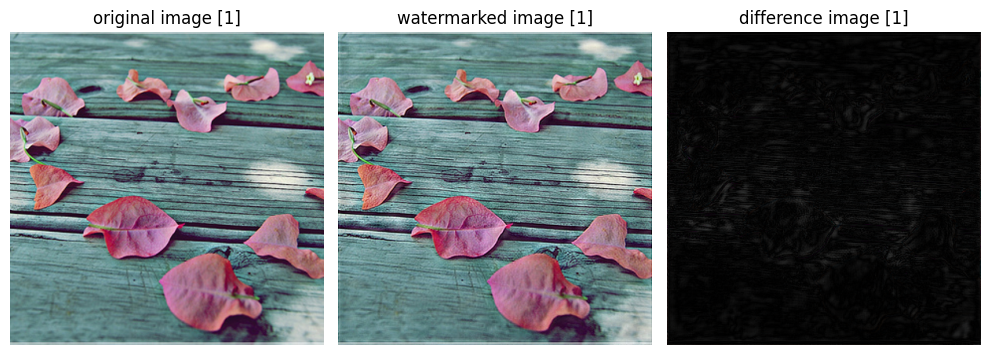

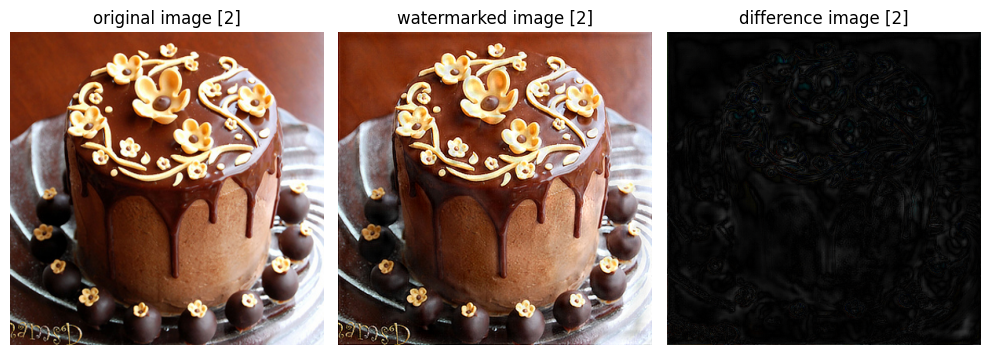

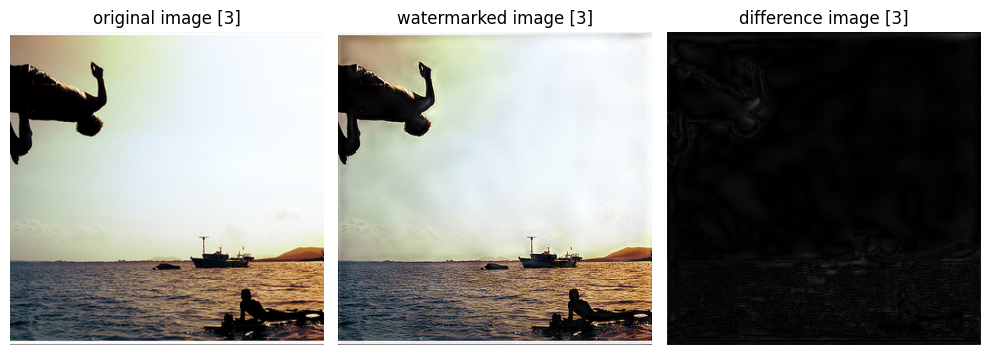

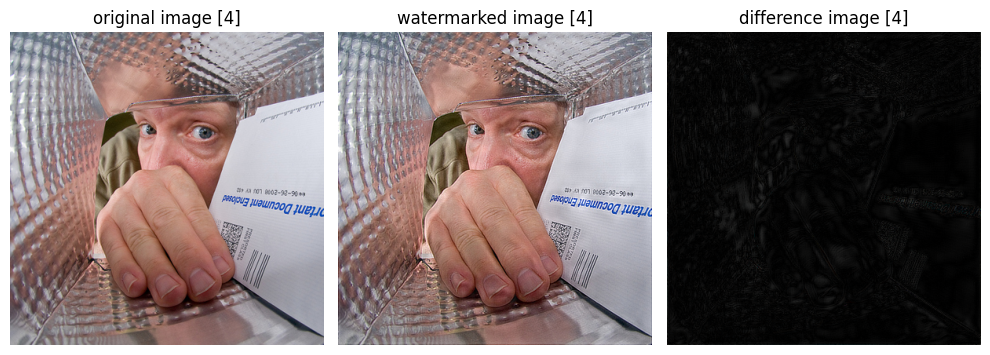

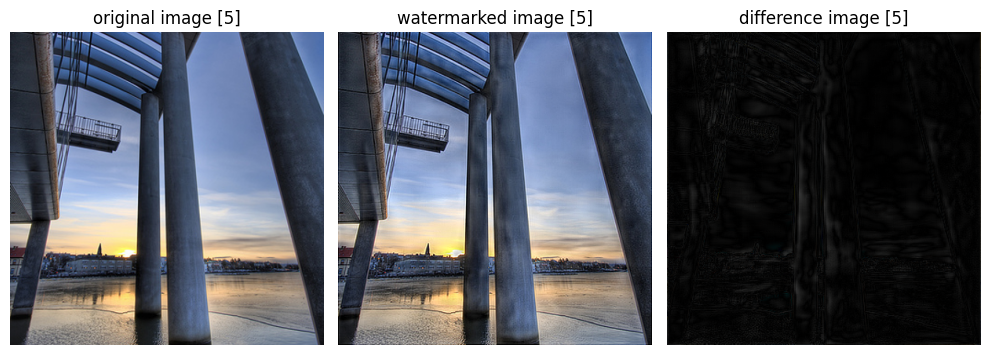

In [ ]:
for i in range(6):
    plot_side_by_side(a, b, i)

# decoding

In [ ]:
def calculate_similarity(arr1, arr2):
  """Calculates the similarity between two arrays using Hamming distance."""
  if arr1.shape != arr2.shape:
    raise ValueError("Arrays must have the same shape for comparison.")

  hamming_distance = np.sum(arr1 != arr2)

  similarity = (arr1.size - hamming_distance) / arr1.size * 100

  return similarity

In [ ]:
decoded_secrets_stegastamp = decode(b.permute(0, 2, 3, 1).numpy(), mode="stegastamp", gpu=1).astype(int)

for i in range(6):
    sim_idx = calculate_similarity(decoded_secrets_stegastamp[i], np.array(secret_list))
    print(f"{sim_idx:.3f}%")

100.000%
100.000%
100.000%
100.000%
100.000%
100.000%


# Influence of coded message

In [ ]:
secret_list = [1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0,
        1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0,
        1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1,
        0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0]

In [ ]:
zeros_secret = [0] * 100

In [ ]:
a, b = encode(inputs, np.array([secret_list for _ in range(inputs.shape[0])]))

In [ ]:
def replace_bit(bit_string, i):
    """Replaces the ith bit of a bit string with 1."""
    bit_list = bit_string.copy()
    if bit_list[i] == 1:
        bit_list[i] = 0
    else:
        bit_list[i] = 1
    return bit_list

def plot_difference_in_bits(image, str0):
    """Plots a[i] and b[i] side-by-side using matplotlib.pyplot."""

    diffs = []

    fig, axs = plt.subplots(10, 10, figsize=(50, 50))
    axs = axs.flatten()

    _, b_zeros_1 = encode(image.reshape(1, 400, 400, 3), np.array([str0]))
    b_encoded_1 = b_zeros_1[0].permute(1, 2, 0).numpy()

    for i in range(100):
        str1 = replace_bit(str0, i)

        _, b_zeros_2 = encode(image.reshape(1, 400, 400, 3), np.array([str1]))
        b_encoded_2 = b_zeros_2[0].permute(1, 2, 0).numpy()

        diff = np.abs(b_encoded_1 - b_encoded_2)
        diffs.append(diff)

        axs[i].imshow(diff)
        axs[i].set_title(f'difference image for bit [{i}]')
        axs[i].axis('off')

    plt.tight_layout()
    plt.show()
    return diffs

### image 4

In [ ]:
diffs = plot_difference_in_bits(inputs[4], zeros_secret)

In [ ]:
import seaborn as sns

def heatmap_diff_sums(diffs, image_num):
    diffs = np.array(diffs)
    diff_sums = np.array([diff.flatten().sum() for diff in diffs]).reshape((10, 10))


    plt.figure(figsize=(7, 7))

    ax = sns.heatmap(diff_sums, fmt=".0f",  cmap="YlGnBu")

    num_rows, num_cols = diff_sums.shape

    for i in range(num_rows):
        for j in range(num_cols):
            ax.text(
                j + 0.5,
                i + 0.5,
                str(i * num_cols + j),
                ha="center",
                va="center",
                color="black",
                fontsize=8,
            )
    plt.title(f'image [{image_num}], sums of bit pos difference from zeros string')
    plt.show()

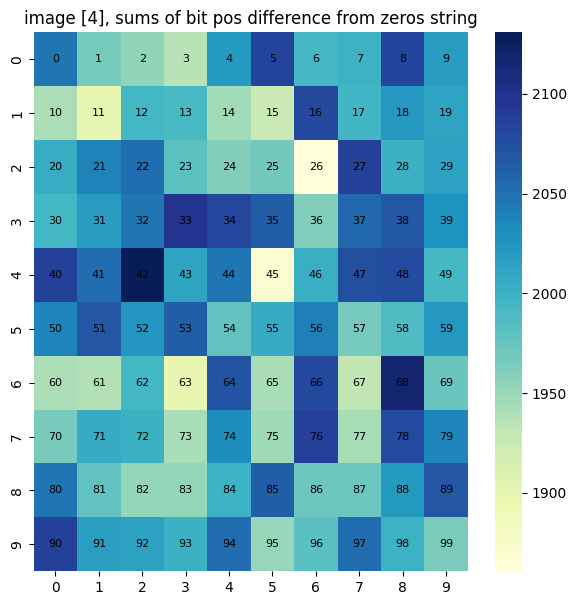

In [ ]:
heatmap_diff_sums(diffs, 4)

### image 0

In [ ]:
diffs = plot_difference_in_bits(inputs[0], zeros_secret)

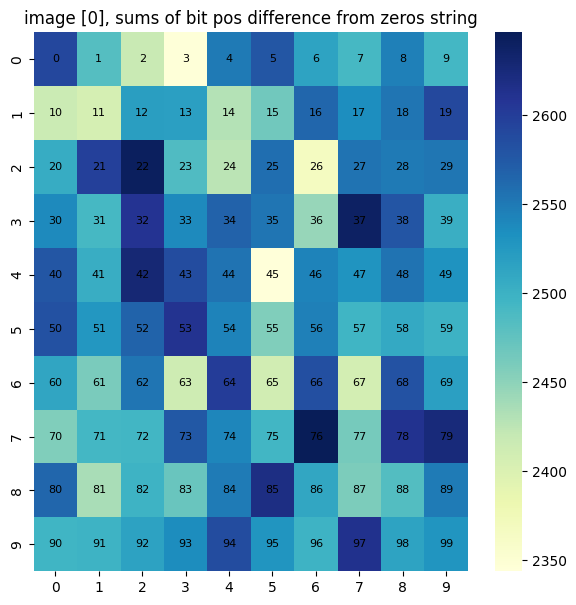

In [ ]:
heatmap_diff_sums(diffs, 0)

### image 1

In [ ]:
diffs = plot_difference_in_bits(inputs[1], zeros_secret)

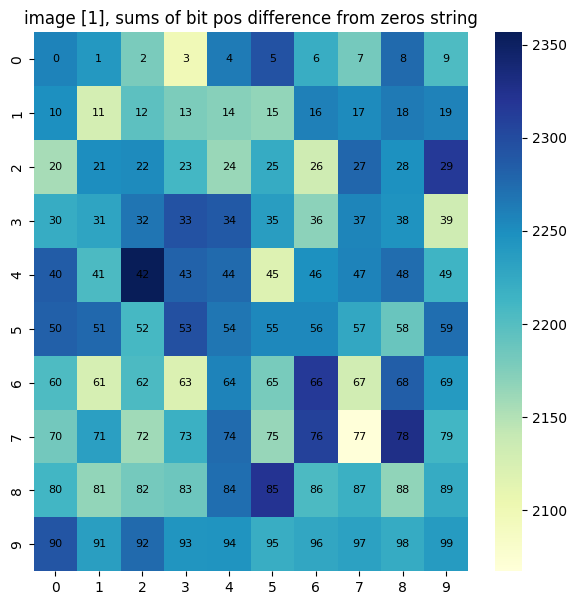

In [ ]:
heatmap_diff_sums(diffs, 1)

### image 2

In [ ]:
diffs = plot_difference_in_bits(inputs[2], zeros_secret)

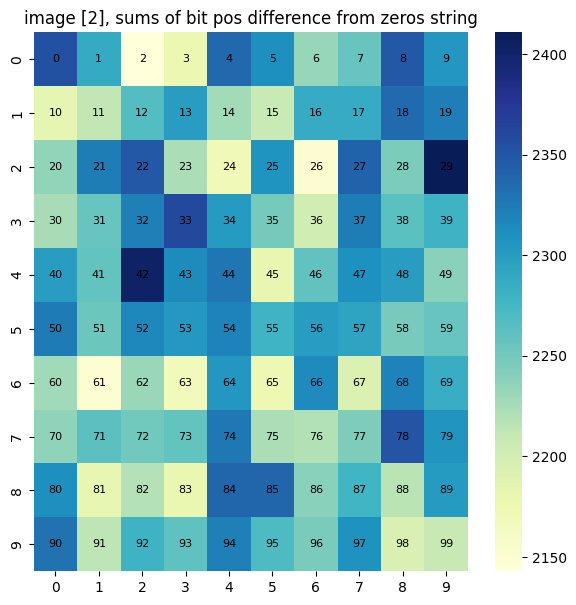

In [ ]:
heatmap_diff_sums(diffs, 2)

### image 3

In [ ]:
diffs = plot_difference_in_bits(inputs[3], zeros_secret)

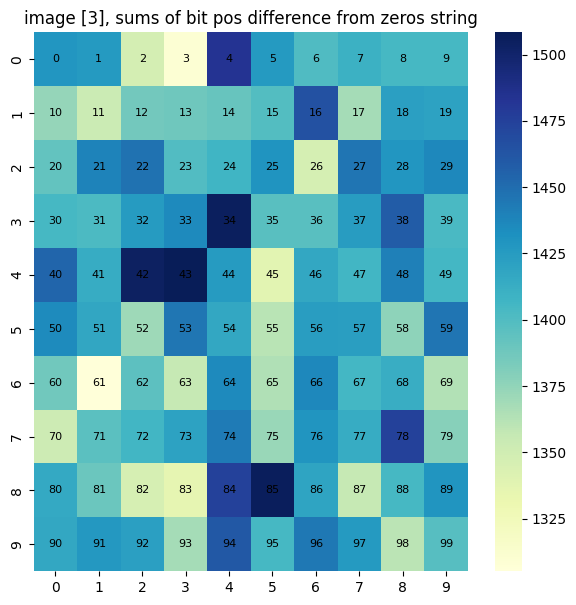

In [ ]:
heatmap_diff_sums(diffs, 3)

### image 5

In [ ]:
diffs = plot_difference_in_bits(inputs[5], zeros_secret)

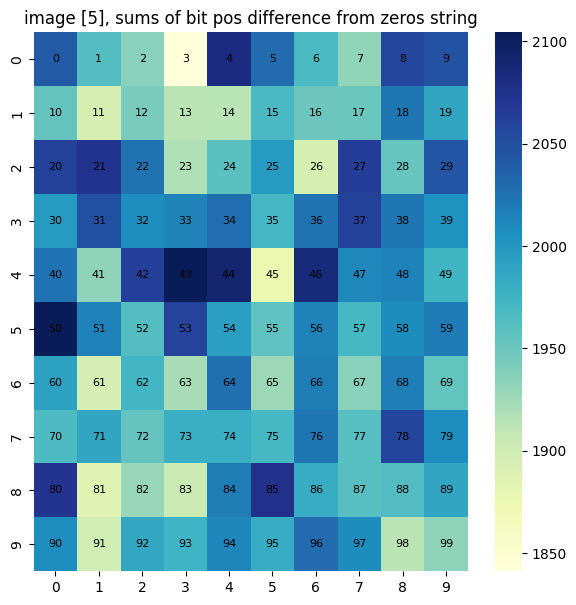

In [ ]:
heatmap_diff_sums(diffs, 5)

## different message

### image 4

In [ ]:
diffs = plot_difference_in_bits(inputs[4], secret_list)

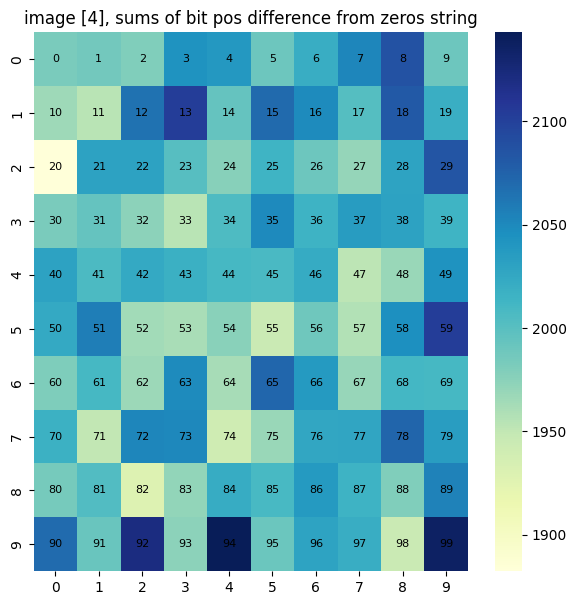

In [ ]:
heatmap_diff_sums(diffs, 4)

### image 0

In [ ]:
diffs = plot_difference_in_bits(inputs[0], secret_list)

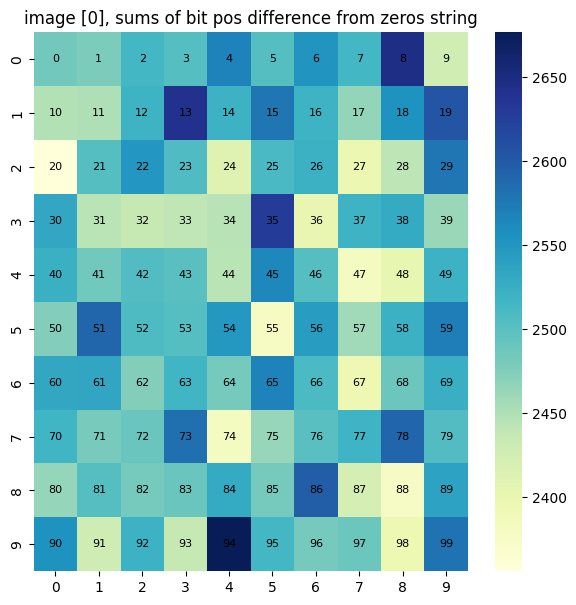

In [ ]:
heatmap_diff_sums(diffs, 0)

### image 1

In [ ]:
diffs = plot_difference_in_bits(inputs[1], secret_list)

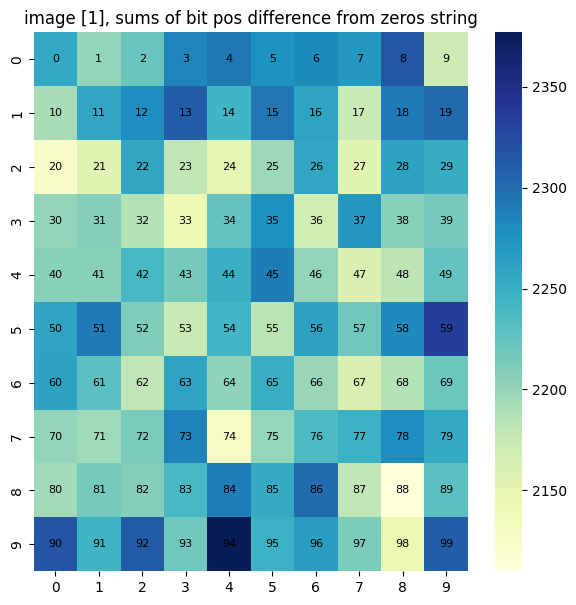

In [ ]:
heatmap_diff_sums(diffs, 1)

### image 2

In [ ]:
diffs = plot_difference_in_bits(inputs[2], secret_list)

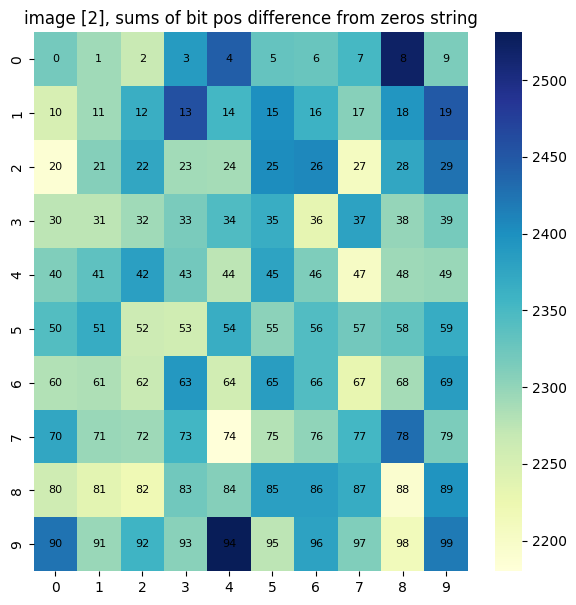

In [ ]:
heatmap_diff_sums(diffs, 2)

### image 3

In [ ]:
diffs = plot_difference_in_bits(inputs[3], secret_list)

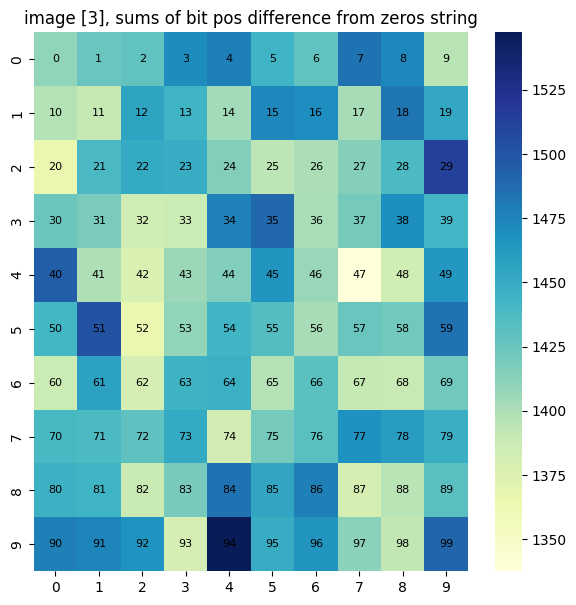

In [ ]:
heatmap_diff_sums(diffs, 3)

### image 5

In [ ]:
diffs = plot_difference_in_bits(inputs[5], secret_list)

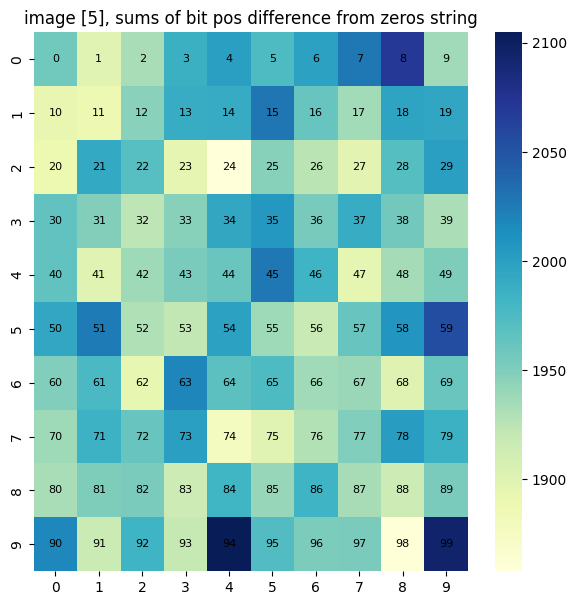

In [ ]:
heatmap_diff_sums(diffs, 5)

# blur distortion

In [ ]:
import cv2

In [ ]:
blurred_images_5 = np.array([cv2.GaussianBlur(image, (7, 7), 0) for image in b.permute(0, 2, 3, 1).numpy()])
blurred_images_9 = np.array([cv2.GaussianBlur(image, (15, 15), 0) for image in b.permute(0, 2, 3, 1).numpy()])
blurred_images_13 = np.array([cv2.GaussianBlur(image, (21, 21), 0) for image in b.permute(0, 2, 3, 1).numpy()])

In [ ]:
def plot_side_by_side(a, b, damaged_light, damaged_medium, damaged_heavy, i):
    """Plots a[i] and b[i] side-by-side using matplotlib.pyplot."""

    fig, axs = plt.subplots(1, 5, figsize=(15, 5))

    axs[0].imshow(a[i])
    axs[0].set_title(f'original image [{i}]')
    axs[0].axis('off')

    axs[1].imshow(b[i].permute(1, 2, 0))
    axs[1].set_title(f'watermarked image [{i}]')
    axs[1].axis('off')

    axs[2].imshow(damaged_light[i])
    axs[2].set_title(f'lightly damaged w-image [{i}]')
    axs[2].axis('off')

    axs[3].imshow(damaged_medium[i])
    axs[3].set_title(f'moderately damaged w-image [{i}]')
    axs[3].axis('off')

    axs[4].imshow(damaged_heavy[i])
    axs[4].set_title(f'heavily damaged w-image [{i}]')
    axs[4].axis('off')

    plt.tight_layout()
    plt.show()

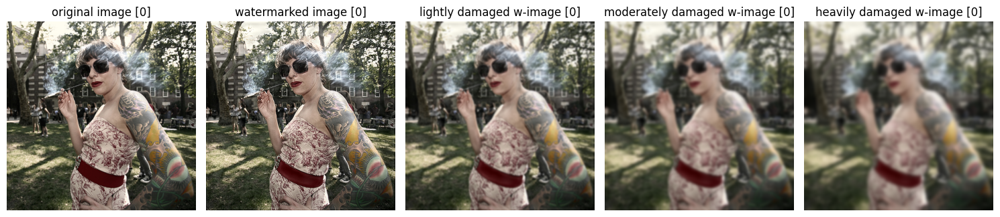

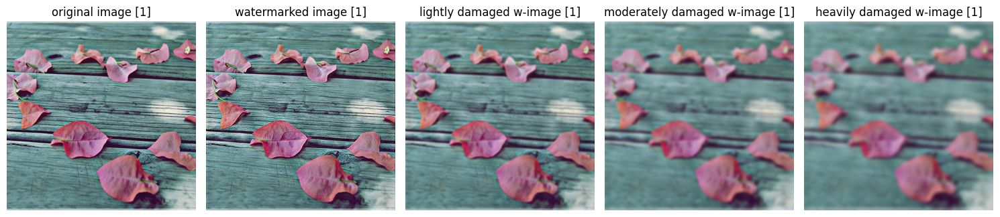

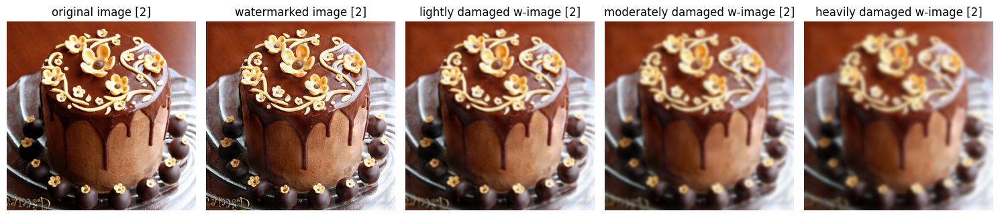

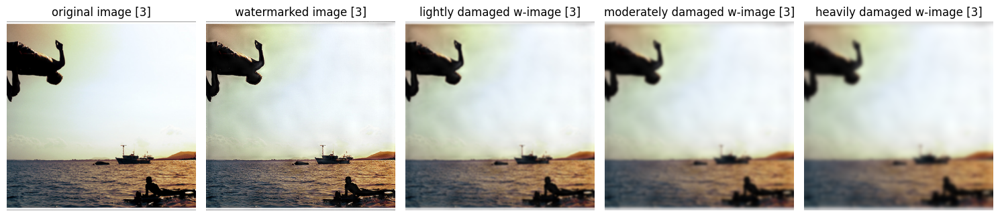

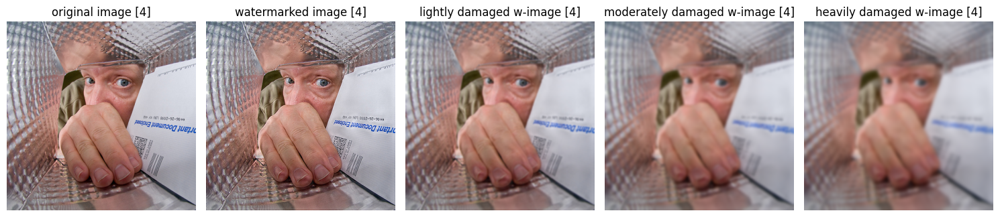

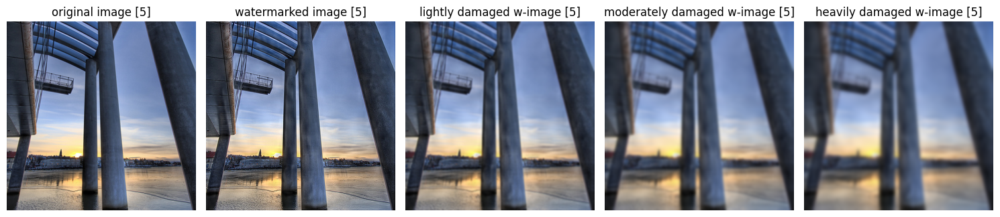

In [ ]:
for i in range(6):
    plot_side_by_side(a, b, blurred_images_5, blurred_images_9, blurred_images_13, i)

In [ ]:
damages = [blurred_images_5, blurred_images_9, blurred_images_13]

In [ ]:
decoded_dict = {}

for i, name in enumerate(['light damage', 'medium damage', 'heavy damage']):
    print('\n\n', name)
    decoded_secrets_stegastamp = decode(damages[i], mode="stegastamp", gpu=1).astype(int)
    decoded_dict[name] = decoded_secrets_stegastamp
    for j in range(6):
        sim_idx = calculate_similarity(decoded_secrets_stegastamp[j], np.array(secret_list))
        print(f"{sim_idx:.3f}%")



 light damage
100.000%
100.000%
100.000%
100.000%
100.000%
100.000%


 medium damage
100.000%
100.000%
100.000%
100.000%
100.000%
98.000%


 heavy damage
96.000%
100.000%
89.000%
100.000%
98.000%
87.000%


In [ ]:
def plot_decoding_errors(decoded_dict, effect):
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    for i, name in enumerate(['light damage', 'medium damage', 'heavy damage']):

        cum_sum_arr = []
        for arr in decoded_dict[name]:
            cum_sum_arr.append(np.logical_xor(np.array(arr), np.array(secret_list)).astype(int))

        errors_sum_array = np.array(cum_sum_arr).sum(axis=0)
        cbar = False
        if i == 2:
            cbar = True
        axes[i].set_title(name)
        sns.heatmap(errors_sum_array.reshape(10, 10), ax=axes[i], cbar=cbar, cmap="YlGnBu")
        num_rows, num_cols = 10, 10

        for k in range(num_rows):
            for j in range(num_cols):
                axes[i].text(
                    j + 0.5,
                    k + 0.5,
                    str(k * num_cols + j),
                    ha="center",
                    va="center",
                    color="black",
                    fontsize=8,
                )
    plt.suptitle(effect)
    plt.show()

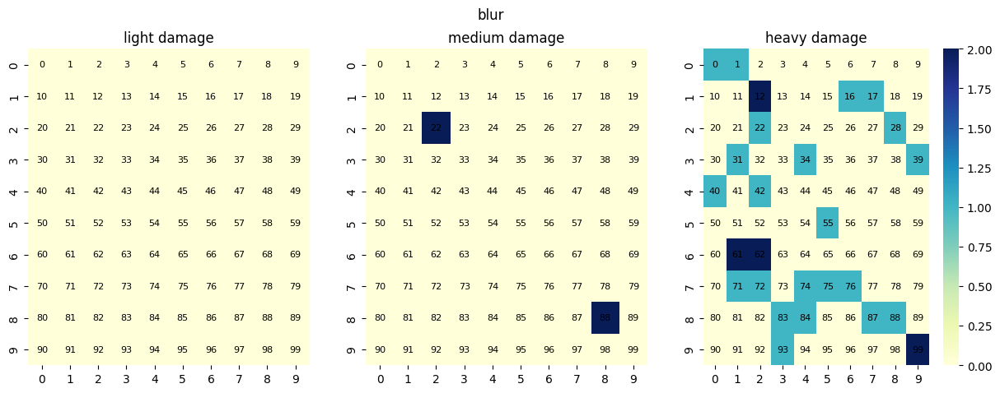

In [ ]:
plot_decoding_errors(decoded_dict, 'blur')

# Noise distortion

In [ ]:
noised_images = []
image = b.permute(0, 2, 3, 1).numpy()

for noise_intensity in [0.1, 0.4, 0.6]:
    noise = np.random.normal(0, noise_intensity, image.shape)
    noisy_image = np.clip(image + noise, 0, 1)
    noised_images.append(noisy_image)

In [ ]:
for i in range(6):
    plot_side_by_side(a, b, noised_images[0], noised_images[1], noised_images[2], i)

In [ ]:
decoded_dict = {}

for i, name in enumerate(['light damage', 'medium damage', 'heavy damage']):
    print('\n\n', name)
    decoded_secrets_stegastamp = decode(noised_images[i].astype(np.float32), mode="stegastamp", gpu=1).astype(int)
    decoded_dict[name] = decoded_secrets_stegastamp
    for j in range(6):
        sim_idx = calculate_similarity(decoded_secrets_stegastamp[j], np.array(secret_list))
        print(f"{sim_idx:.3f}%")



 light damage
100.000%
99.000%
99.000%
95.000%
99.000%
99.000%


 medium damage
95.000%
86.000%
85.000%
77.000%
81.000%
81.000%


 heavy damage
73.000%
74.000%
72.000%
60.000%
71.000%
72.000%


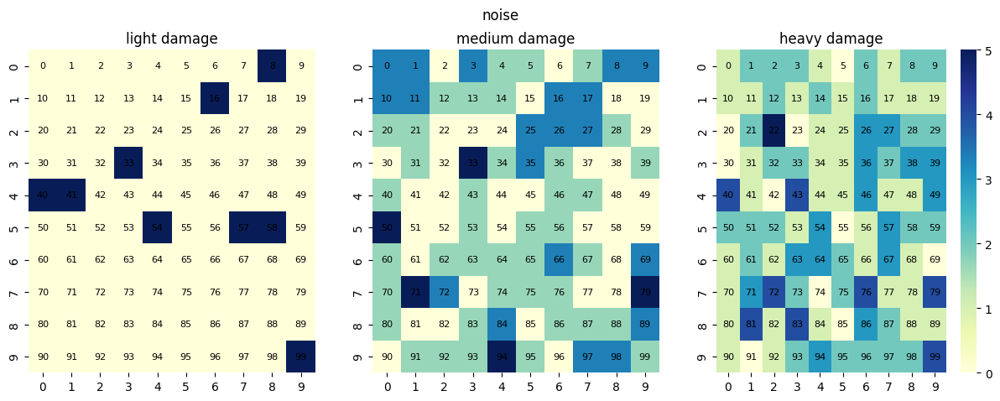

In [ ]:
plot_decoding_errors(decoded_dict, 'noise')

# increased brightness

In [ ]:
def adjust_brightness(image, factor):
    return np.clip(image * factor, 0, 1)

distorted_images = [adjust_brightness(image, factor=f) for f in [1.5, 3, 5]]

In [ ]:
for i in range(6):
    plot_side_by_side(a, b, distorted_images[0], distorted_images[1], distorted_images[2], i)

In [ ]:
decoded_dict = {}
for i, name in enumerate(['light damage', 'medium damage', 'heavy damage']):
    print('\n\n', name)
    decoded_secrets_stegastamp = decode(distorted_images[i].astype(np.float32), mode="stegastamp", gpu=1).astype(int)
    decoded_dict[name] = decoded_secrets_stegastamp
    for j in range(6):
        sim_idx = calculate_similarity(decoded_secrets_stegastamp[j], np.array(secret_list))
        print(f"{sim_idx:.3f}%")



 light damage
100.000%
100.000%
100.000%
83.000%
99.000%
100.000%


 medium damage
97.000%
91.000%
99.000%
76.000%
73.000%
90.000%


 heavy damage
89.000%
64.000%
97.000%
73.000%
65.000%
87.000%


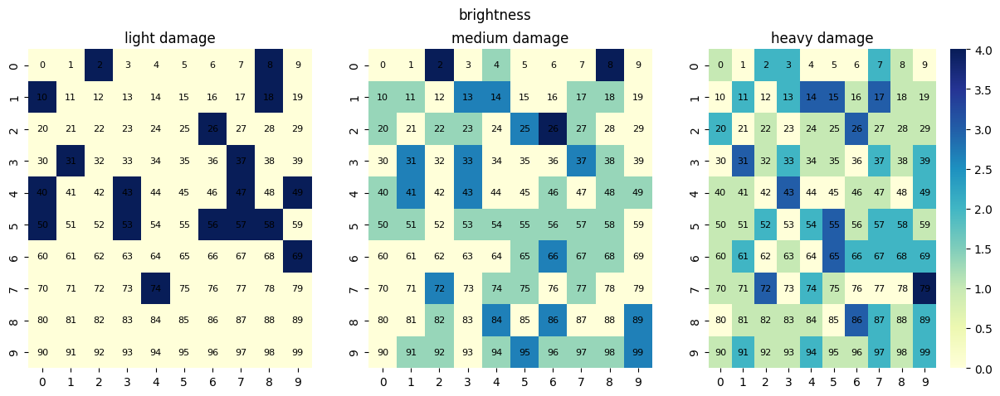

In [ ]:
plot_decoding_errors(decoded_dict, 'brightness')

# Geometric distortion

In [ ]:
def geometric_distortion(images, param):

  distorted_images = []
  for image in images:
    rows, cols, _ = image.shape
    M = cv2.getRotationMatrix2D((cols / 2, rows / 2), param, 1)
    rotated_image = cv2.warpAffine(image, M, (cols, rows))
    distorted_images.append(rotated_image)

  return np.stack(distorted_images)

In [ ]:
distorted_images = [geometric_distortion(image, param) for param in [15, 30, 50]]

In [ ]:
for i in range(6):
    plot_side_by_side(a, b, distorted_images[0], distorted_images[1], distorted_images[2], i)

In [ ]:
decoded_dict = {}
for i, name in enumerate(['light damage', 'medium damage', 'heavy damage']):
    print('\n\n', name)
    decoded_secrets_stegastamp = decode(distorted_images[i].astype(np.float32), mode="stegastamp", gpu=1).astype(int)
    decoded_dict[name] = decoded_secrets_stegastamp
    for j in range(6):
        sim_idx = calculate_similarity(decoded_secrets_stegastamp[j], np.array(secret_list))
        print(f"{sim_idx:.3f}%")



 light damage
55.000%
53.000%
49.000%
52.000%
53.000%
52.000%


 medium damage
52.000%
46.000%
48.000%
44.000%
48.000%
54.000%


 heavy damage
58.000%
54.000%
51.000%
53.000%
57.000%
61.000%


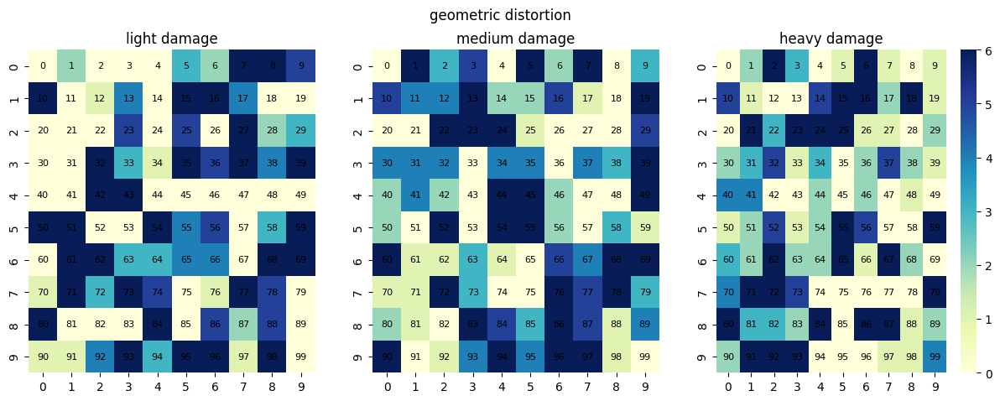

In [ ]:
plot_decoding_errors(decoded_dict, 'geometric distortion')

# Compression artifacts

In [ ]:
def apply_jpeg_compression(images, quality=50):
    distorted_images = []
    for i, image in enumerate(images):
        temp_file_path = f"temp_compressed_{i}.jpg"

        cv2.imwrite(temp_file_path, (image * 255).astype(np.uint8), [int(cv2.IMWRITE_JPEG_QUALITY), quality])

        compressed_image = cv2.imread(temp_file_path) / 255.0

        os.remove(temp_file_path)

        distorted_images.append(compressed_image)

    return np.stack(distorted_images)

In [ ]:
distorted_images = [apply_jpeg_compression(image, quality=q) for q in [10, 5, 2]]

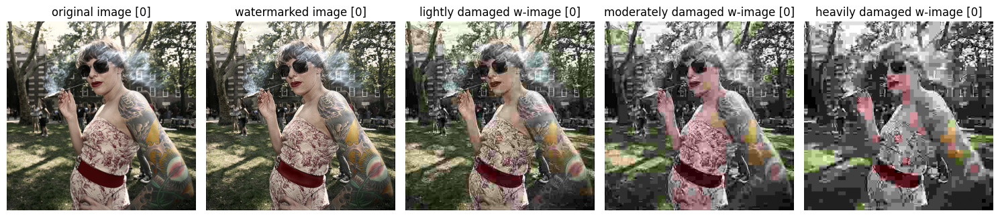

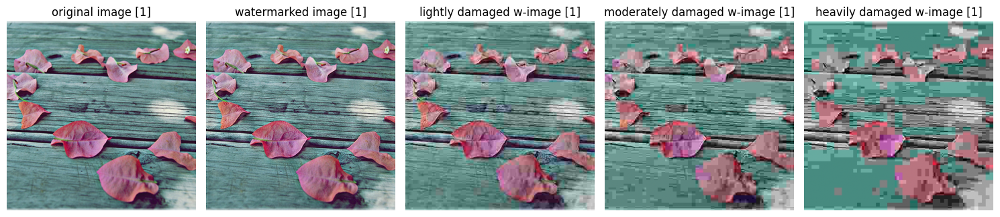

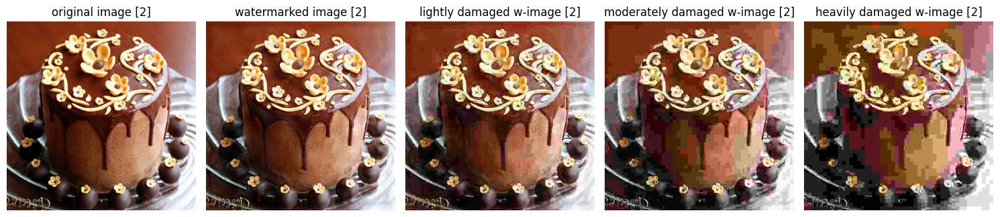

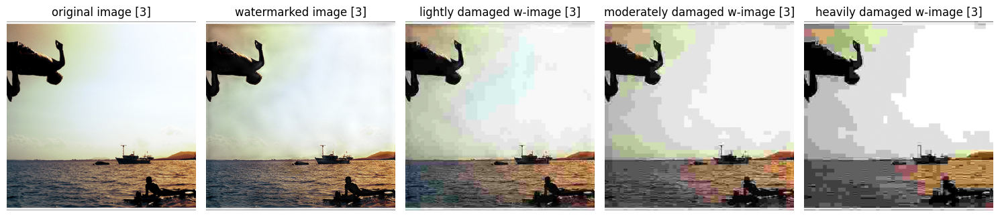

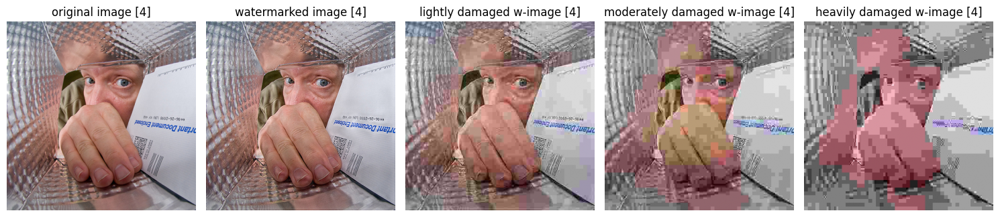

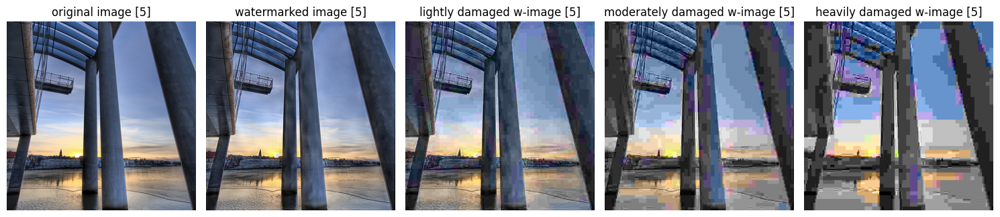

In [ ]:
for i in range(6):
    plot_side_by_side(a, b, distorted_images[0], distorted_images[1], distorted_images[2], i)

In [ ]:
decoded_dict = {}
for i, name in enumerate(['light damage', 'medium damage', 'heavy damage']):
    print('\n\n', name)
    decoded_secrets_stegastamp = decode(distorted_images[i].astype(np.float32), mode="stegastamp", gpu=1).astype(int)
    decoded_dict[name] = decoded_secrets_stegastamp
    for j in range(6):
        sim_idx = calculate_similarity(decoded_secrets_stegastamp[j], np.array(secret_list))
        print(f"{sim_idx:.3f}%")



 light damage
99.000%
98.000%
98.000%
77.000%
94.000%
97.000%


 medium damage
97.000%
80.000%
79.000%
63.000%
79.000%
69.000%


 heavy damage
83.000%
58.000%
66.000%
51.000%
60.000%
56.000%


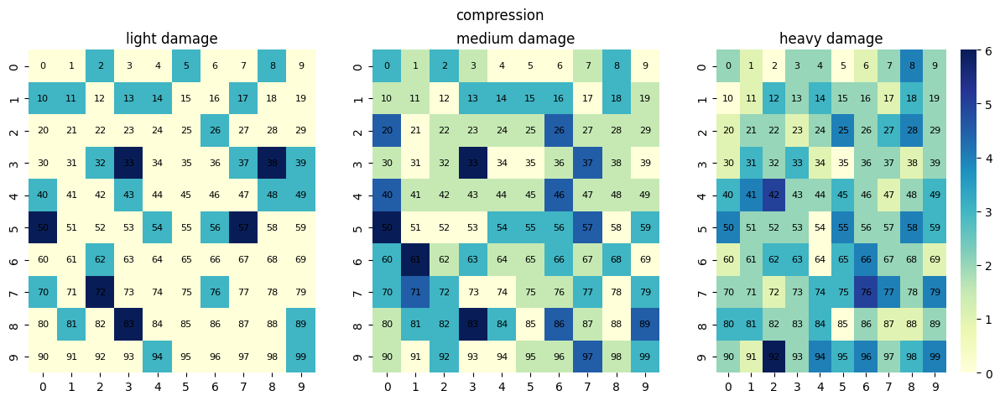

In [ ]:
plot_decoding_errors(decoded_dict, 'compression')